In [1]:
#!pip install kneed

In [2]:
# import dependencies 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import hvplot.pandas
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_squared_error, mean_absolute_error

from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import GradientBoostingRegressor

import warnings
warnings.filterwarnings("ignore")


In [3]:
# reading the dataset
spotify_song_data = pd.read_csv('./data/song_data.csv')


In [4]:
# Review the DataFrame
spotify_song_data.head()

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
0,Boulevard of Broken Dreams,73,262333,0.005520,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.474
1,In The End,66,216933,0.010300,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.370
2,Seven Nation Army,76,231733,0.008170,0.737,0.463,0.447000,0,0.2550,-7.828,1,0.0792,123.881,4,0.324
3,By The Way,74,216933,0.026400,0.451,0.970,0.003550,0,0.1020,-4.938,1,0.1070,122.444,4,0.198
4,How You Remind Me,56,223826,0.000954,0.447,0.766,0.000000,10,0.1130,-5.065,1,0.0313,172.011,4,0.574


In [5]:
spotify_song_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18835 entries, 0 to 18834
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_name         18835 non-null  object 
 1   song_popularity   18835 non-null  int64  
 2   song_duration_ms  18835 non-null  int64  
 3   acousticness      18835 non-null  float64
 4   danceability      18835 non-null  float64
 5   energy            18835 non-null  float64
 6   instrumentalness  18835 non-null  float64
 7   key               18835 non-null  int64  
 8   liveness          18835 non-null  float64
 9   loudness          18835 non-null  float64
 10  audio_mode        18835 non-null  int64  
 11  speechiness       18835 non-null  float64
 12  tempo             18835 non-null  float64
 13  time_signature    18835 non-null  int64  
 14  audio_valence     18835 non-null  float64
dtypes: float64(9), int64(5), object(1)
memory usage: 2.2+ MB


array([[<AxesSubplot:xlabel='song_popularity', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='song_duration_ms', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='acousticness', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='danceability', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='energy', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='instrumentalness', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='key', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='liveness', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='loudness', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='audio_mode', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='speechiness', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='tempo', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='time_signature', ylabel='song_popularity'>,
        <AxesSubplot:xlabel='audio_valence', ylabel='song_popularity'>],
       [<AxesSubplot:xla

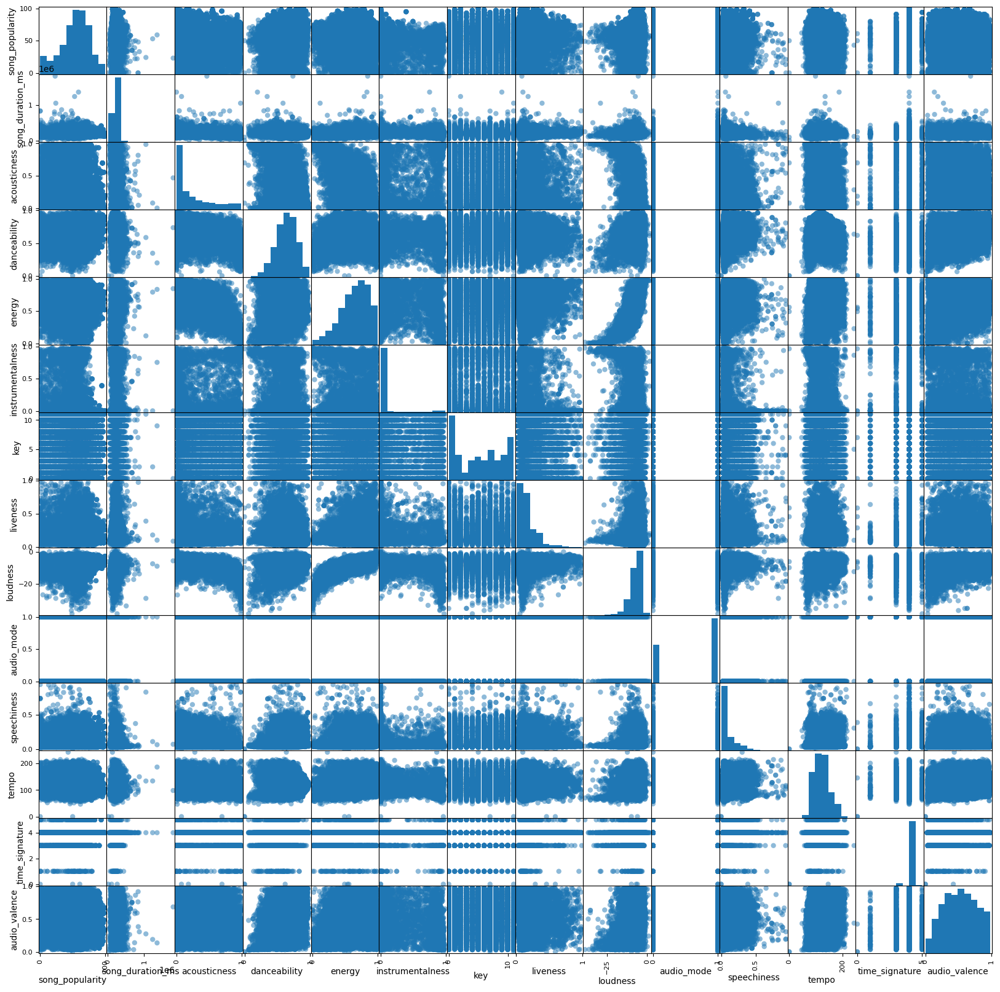

In [6]:
pd.plotting.scatter_matrix(spotify_song_data,figsize=(20,20),grid=True,marker='o')

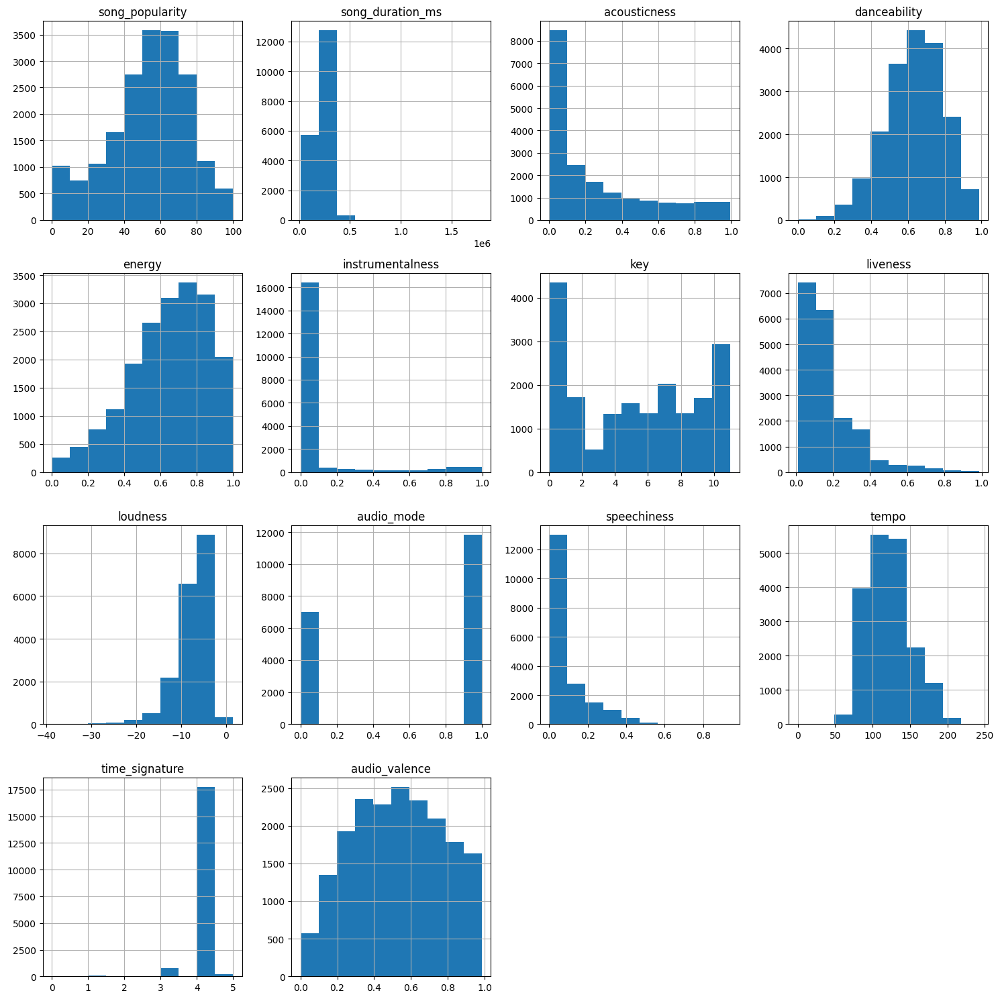

In [7]:
import matplotlib.pyplot as plt
spotify_song_data.hist(figsize=(15,15))
plt.tight_layout()
plt.show()

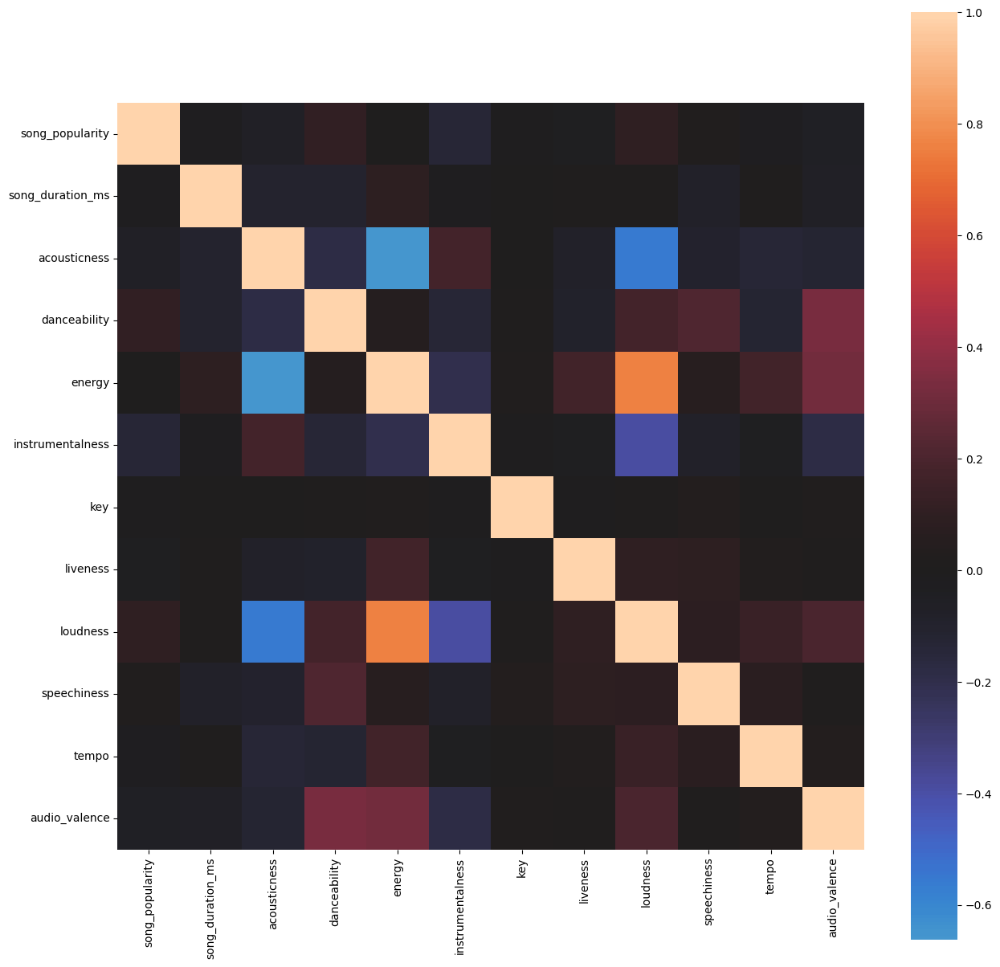

In [8]:
song_data = spotify_song_data.drop(['time_signature','audio_mode'] , axis=1)
import seaborn as sns
plt.gcf().set_size_inches(15, 15)
cmap=sns.diverging_palette(500,10,as_cmap=True)
sns.heatmap(song_data.corr(),center=0,annot=False,square=True)
plt.show()

In [9]:
new_song_data = song_data.drop(['song_name'], axis = 1)


In [10]:
#Standartize Data
scaler = MinMaxScaler()
scaler.fit(new_song_data)
scaled_song_data = scaler.transform(new_song_data)
scaled_song_data_df = pd.DataFrame(scaled_song_data,columns = ['song_popularity','song_duration_ms',
                                    'acousticness','danceability','energy','instrumentalness','key','liveness',
                                                               'loudness','speechiness','tempo','audio_valence'])
scaled_song_data_df.head()

,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,speechiness,tempo,audio_valence
0,0.73,0.140059,0.005541,0.502533,0.682342,0.000029,0.727273,0.049226,0.859242,0.031243,0.689425,0.481707
1,0.66,0.114658,0.010340,0.549139,0.853697,0.000000,0.272727,0.099580,0.801948,0.052922,0.434371,0.376016
2,0.76,0.122938,0.008202,0.746707,0.462888,0.448345,0.000000,0.250333,0.766734,0.084166,0.511233,0.329268
3,0.74,0.114658,0.026505,0.456940,0.970940,0.003561,0.000000,0.093426,0.838352,0.113709,0.505303,0.201220
4,0.56,0.118514,0.000957,0.452888,0.766517,0.000000,0.909091,0.104707,0.835204,0.033262,0.709856,0.583333


In [11]:
inertia = []
k = list(range(1, 11))

# Calculate the inertia for the range of k values
for i in k:
    km = KMeans(n_clusters=i, random_state=2)
    km.fit(scaled_song_data_df)
    inertia.append(km.inertia_)

# Create the Elbow Curve using hvPlot
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.head()

,k,inertia
0,1,9053.718159
1,2,7340.786658
2,3,6066.814381
3,4,5568.816715
4,5,5200.876761


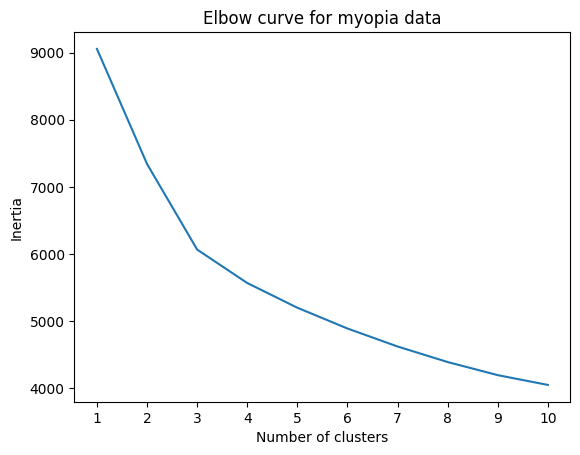

In [12]:
# Plot the elbow curve to find the best candidate(s) for k
plt.plot(df_elbow['k'], df_elbow['inertia'])
plt.xticks(range(1,11))
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow curve for myopia data')
plt.show()

In [13]:
# Create a KneeLocator object to find the elbow point in the plot
from kneed import KneeLocator
kl = KneeLocator(range(1, 11), inertia, curve='convex', direction='decreasing')

# Use the elbow attribute of the KneeLocator object to find the index of the elbow point, which corresponds to the best k value
best_k = kl.elbow

# Print the best k value
print('The best k value is:', best_k)

The best k value is: 3


In [14]:
# Initialize the K-Means model
model = KMeans(n_clusters=3, random_state=1)

# Train the model
model.fit(scaled_song_data_df)

# Predict clusters
predictions = model.predict(scaled_song_data_df)


clustered_data = scaled_song_data_df.copy()
clustered_data['cluster'] = predictions


In [15]:
clustered_data.head()

,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,speechiness,tempo,audio_valence,cluster
0,0.73,0.140059,0.005541,0.502533,0.682342,0.000029,0.727273,0.049226,0.859242,0.031243,0.689425,0.481707,1
1,0.66,0.114658,0.010340,0.549139,0.853697,0.000000,0.272727,0.099580,0.801948,0.052922,0.434371,0.376016,0
2,0.76,0.122938,0.008202,0.746707,0.462888,0.448345,0.000000,0.250333,0.766734,0.084166,0.511233,0.329268,0
3,0.74,0.114658,0.026505,0.456940,0.970940,0.003561,0.000000,0.093426,0.838352,0.113709,0.505303,0.201220,0
4,0.56,0.118514,0.000957,0.452888,0.766517,0.000000,0.909091,0.104707,0.835204,0.033262,0.709856,0.583333,1


In [16]:
# Import the PCA module
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
song_data_pca_df = pd.DataFrame(pca.fit_transform(clustered_data.drop(['cluster'],axis = 1)),columns = ['PC1','PC2'])
song_data_pca_df.head()

,PC1,PC2
0,-0.237526,0.213786
1,-0.227335,-0.242281
2,0.080379,-0.495327
3,-0.201771,-0.520125
4,-0.315053,0.395759


In [17]:
song_data_pca_df['cluster'] = predictions
song_data_pca_df.head()

,PC1,PC2,cluster
0,-0.237526,0.213786,1
1,-0.227335,-0.242281,0
2,0.080379,-0.495327,0
3,-0.201771,-0.520125,0
4,-0.315053,0.395759,1


Text(0.5, 1.0, 'Music Recommendation after PCA')

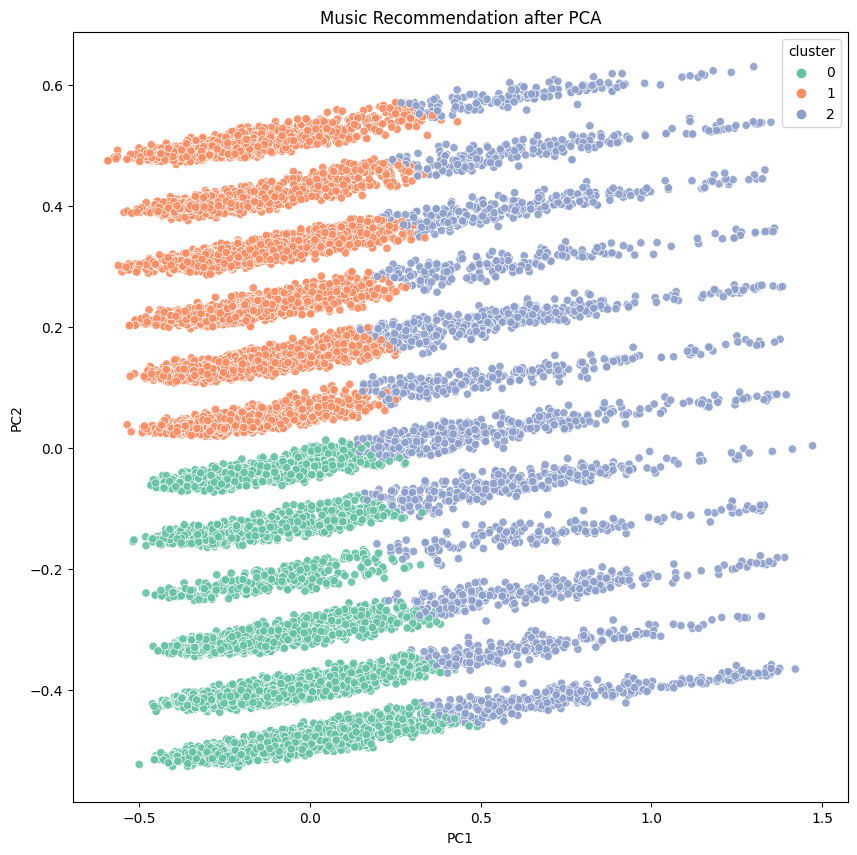

In [18]:
import seaborn as sns
plt.figure(figsize=(10,10))
sns.scatterplot(data=song_data_pca_df,x='PC1',y='PC2',hue=clustered_data['cluster'],palette='Set2' , alpha = 0.9)
plt.title('Music Recommendation after PCA')

In [19]:
# Initialize the K-Means model
model = KMeans(n_clusters=20, random_state=1)

# Train the model
model.fit(scaled_song_data_df)

# Predict clusters
predictions = model.predict(scaled_song_data_df)


clustered_data = scaled_song_data_df.copy()
clustered_data['cluster'] = predictions
clustered_data.head()

,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,speechiness,tempo,audio_valence,cluster
0,0.73,0.140059,0.005541,0.502533,0.682342,0.000029,0.727273,0.049226,0.859242,0.031243,0.689425,0.481707,4
1,0.66,0.114658,0.010340,0.549139,0.853697,0.000000,0.272727,0.099580,0.801948,0.052922,0.434371,0.376016,7
2,0.76,0.122938,0.008202,0.746707,0.462888,0.448345,0.000000,0.250333,0.766734,0.084166,0.511233,0.329268,12
3,0.74,0.114658,0.026505,0.456940,0.970940,0.003561,0.000000,0.093426,0.838352,0.113709,0.505303,0.201220,7
4,0.56,0.118514,0.000957,0.452888,0.766517,0.000000,0.909091,0.104707,0.835204,0.033262,0.709856,0.583333,4


In [20]:
#Plot the clusters
clustered_data.hvplot.scatter(
    x="song_popularity",
    y="key",
    by='cluster'
).opts(yformatter="%.0f")

:NdOverlay   [cluster]
   :Scatter   [song_popularity]   (key)

In [21]:
#Plot the clusters
song_data_pca_df.hvplot.scatter(
    x="PC1",
    y="PC2",
    by='cluster'
).opts(yformatter="%.0f")

:NdOverlay   [cluster]
   :Scatter   [PC1]   (PC2)